# Latar Belakang

Pimpinan dari **Police Department** ingin merekrut seorang *data scientist* untuk menganalisa insiden yang terjadi di kota Boston, Massachusetts. Data yang akan digunakan memiliki periode 14 Juni 2015 - 3 September 2018. Hasil analisa data kriminal ini akan digunakan police departmen untuk mengatur dan merancang rencana kerja yang diharapkan akan menekan angka insiden atau semacamnya, serta untuk mengidentifikasi kejahatan apa yang sering terjadi di suatu lokasi, agar dapat mengantisipasi dan menyesuaikan polisi yang akan betugas.

# Pernyataan Masalah
**Police Department** ingin mengetahui insiden apa dan dimana lokasi yang sering terjadi. Dari informasi tersebut dapat menentukan kesiapan, tidakan dan strategi apa yang akan dilakukan untuk mengurangi angka terjadinya suatu insiden.

Sebagai seorang *data analyst*, kita akan mencoba menjawab pertanyaan berikut:
1. Bagaimana trend **angka insiden** di kota Boston?
2. Bagaimana trend **jenis insiden** di kota Boston? (Pengaruh terhadap tindakan yang perlu dilakukan)
3. Dimana distrik yang paling banyak insiden terjadi? 
4. Dimanakah titik spesifik yang paling sering terjadi suatu insiden?
5. Insiden apa yang menyebabkan adanya penembakan?

# Data

Untuk menjawab pertanyaan di atas, kita akan menganalisa data Crimes in Boston yang sudah dikumpulkan. Dataset dapat diakses [di sini](https://www.kaggle.com/datasets/AnalyzeBoston/crimes-in-boston). 


In [1]:
# import library
import numpy as np
import pandas as pd
from datetime import datetime

import seaborn as sns
import matplotlib.pyplot as plt
# %matplotlib inline

import folium
from folium.plugins import HeatMap

from operator import attrgetter

import json

# warnings.filterwarnings("ignore")

Dataset ini berisi informasi terkait kejahatan di kota boston. Ada 17 kolom di dalam dataset ini, yaitu:  

* INCIDENT_NUMBER       = ID unik untuk tiap incident
* OFFENSE_CODE          = Data ini menunjukkan ID jenis kejahatan
* OFFENSE_CODE_GROUP    = Nama dari setiap jenis kejahatan
* OFFENSE_DESCRIPTION   = Penjelasan kejahatan tertentu. (dapat digunakan untuk penyelidikan lebih lanjut)
* DISTRICT              = Kode zona
* REPORTING_AREA        = Nomor area yang dilaporkan kejahatan.
* SHOOTING              = Jika kejahatan terjadi tembakan, itu ditunjukkan dengan 'Y'
* OCCURRED_ON_DATE      = waktu kejahatan yang tepat. (tahun, bulan, hari dan waktu)
* YEAR                  = 2015,2016,2017,2018
* MONTH                 = bulan terjadinya kejahatan
* DAY_OF_WEEK           = minggu terjadinya kejahatan
* HOUR                  = jam terjadinya kejahatan
* UCR_PART              = Jenis Pelaporan Kejahatan
* STREET                = nama jalan tempat kejahatan terjadi
* Lat                   = garis lintang lokasi terjadinya kejahatan
* Long                  = garis bujur lokasi terjadinya kejahatan
* Location              = letak lintang dan bujur yang bersamaan dengan terjadinya kejahatan.

In [2]:
df = pd.read_csv('crime.csv', encoding='latin-1')

## Data Understanding and Cleaning
Sebelum masuk ke dalam analisis, kita perlu mengenal dataset kita lebih jauh dalam tahapan *data understanding*. Dari proses ini, kita akan tahu anomali-anomali apa saja yang terdapat di dalam dataset kita dan perlu ditangani dalam tahapan *data cleaning*. Setiap penangan anomali yang dilakukan, akan disertai dengan justifikasi langkah yang diambil, baik secara *domain knowledge* maupun secara statistik.

Pertama, mari kita lihat informasi dari dataset.

### MEMAHAMI TABEL

In [3]:
df.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182070945,619,Larceny,LARCENY ALL OTHERS,D14,808,NaN,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,LINCOLN ST,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,1402,Vandalism,VANDALISM,C11,347,NaN,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,HECLA ST,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,3410,Towed,TOWED MOTOR VEHICLE,D4,151,NaN,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,CAZENOVE ST,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,3114,Investigate Property,INVESTIGATE PROPERTY,D4,272,NaN,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,NEWCOMB ST,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,3114,Investigate Property,INVESTIGATE PROPERTY,B3,421,NaN,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,DELHI ST,42.275365,-71.090361,"(42.27536542, -71.09036101)"


In [4]:
print(f'Jumlah baris dan kolom di dataset df adalah {df.shape}')
df.info()

Jumlah baris dan kolom di dataset df adalah (319073, 17)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 319073 entries, 0 to 319072
Data columns (total 17 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   INCIDENT_NUMBER      319073 non-null  object 
 1   OFFENSE_CODE         319073 non-null  int64  
 2   OFFENSE_CODE_GROUP   319073 non-null  object 
 3   OFFENSE_DESCRIPTION  319073 non-null  object 
 4   DISTRICT             317308 non-null  object 
 5   REPORTING_AREA       319073 non-null  object 
 6   SHOOTING             1019 non-null    object 
 7   OCCURRED_ON_DATE     319073 non-null  object 
 8   YEAR                 319073 non-null  int64  
 9   MONTH                319073 non-null  int64  
 10  DAY_OF_WEEK          319073 non-null  object 
 11  HOUR                 319073 non-null  int64  
 12  UCR_PART             318983 non-null  object 
 13  STREET               308202 non-null  object 
 14  Lat        

In [5]:
display(df.describe(), df.describe(include='object'))

,OFFENSE_CODE,YEAR,MONTH,HOUR,Lat,Long
count,319073.000000,319073.000000,319073.000000,319073.000000,299074.000000,299074.000000
mean,2317.546956,2016.560586,6.609719,13.118205,42.214381,-70.908272
std,1185.285543,0.996344,3.273691,6.294205,2.159766,3.493618
min,111.000000,2015.000000,1.000000,0.000000,-1.000000,-71.178674
25%,1001.000000,2016.000000,4.000000,9.000000,42.297442,-71.097135
50%,2907.000000,2017.000000,7.000000,14.000000,42.325538,-71.077524
75%,3201.000000,2017.000000,9.000000,18.000000,42.348624,-71.062467
max,3831.000000,2018.000000,12.000000,23.000000,42.395042,-1.000000


,INCIDENT_NUMBER,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,DAY_OF_WEEK,UCR_PART,STREET,Location
count,319073,319073,319073,317308,319073,1019,319073,319073,318983,308202,319073
unique,282517,67,244,12,879,1,233229,7,4,4657,18194
top,I162030584,Motor Vehicle Accident Response,SICK/INJURED/MEDICAL - PERSON,B2,,Y,2017-06-01 00:00:00,Friday,Part Three,WASHINGTON ST,"(0.00000000, 0.00000000)"
freq,13,37132,18783,49945,20250,1019,29,48495,158553,14194,19999


In [6]:
pd.set_option('display.max_colwidth', -1)
# data uni di tiap kolom
listItem = []
for col in df.columns :
    listItem.append( [col, df[col].nunique(), df[col].unique()])

tabel1Desc = pd.DataFrame(columns=['Column Name', 'Number of Unique', 'Unique Sample'],
                    data=listItem)
tabel1Desc

C:\Users\User\AppData\Local\Temp\ipykernel_11932\1335281898.py:1: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


,Column Name,Number of Unique,Unique Sample
0,INCIDENT_NUMBER,282517,"[I182070945, I182070943, I182070941, I182070940, I182070938, I182070936, I182070933, I182070932, I182070931, I182070929, I182070928, I182070927, I182070923, I182070922, I182070921, I182070920, I182070919, I182070918, I182070917, I182070915, I182070913, I182070911, I182070910, I182070909, I182070908, I182070906, I182070905, I182070904, I182070903, I182070901, I182070900, I182070898, I182070897, I182070895, I182070893, I182070892, I182070891, I182070890, I182070889, I182070888, I182070887, I182070886, I182070885, I182070882, I182070881, I182070880, I182070879, I182070877, I182070876, I182070875, I182070874, I182070873, I182070872, I182070871, I182070870, I182070868, I182070866, I182070865, I182070863, I182070862, I182070861, I182070860, I182070859, I182070858, I182070857, I182070856, I182070855, I182070854, I182070852, I182070851, I182070850, I182070849, I182070847, I182070846, I182070844, I182070843, I182070842, I182070841, I182070840, I182070839, I182070838, I182070837, I182070836, I182070835, I182070834, I182070833, I182070832, I182070831, I182070830, I182070829, I182070828, I182070827, I182070826, I182070825, I182070824, I182070823, I182070822, I182070820, I182070819, I182070818, ...]"
1,OFFENSE_CODE,222,"[619, 1402, 3410, 3114, 3820, 724, 3301, 301, 3108, 2647, 3201, 3006, 3305, 614, 3801, 3803, 522, 3831, 802, 2007, 2900, 2907, 2629, 2662, 3207, 613, 3109, 2612, 1843, 3125, 1841, 3802, 3018, 2405, 617, 3625, 3106, 3501, 3115, 616, 3807, 1102, 1849, 2905, 1810, 1842, 1806, 1848, 1844, 423, 3205, 413, 1501, 3001, 3830, 561, 2914, 2610, 1109, 706, 2403, 3160, 900, 801, 3002, 520, 2648, 670, 615, 3116, 1504, 1830, 361, 2006, 311, 1001, 3810, 2401, 2646, 3821, 3811, 3007, 2660, 1831, 3119, 3170, 1874, 3112, 3502, 735, 612, 560, 381, 3402, 1815, 1107, 2101, 1106, 3202, 1503, ...]"
2,OFFENSE_CODE_GROUP,67,"[Larceny, Vandalism, Towed, Investigate Property, Motor Vehicle Accident Response, Auto Theft, Verbal Disputes, Robbery, Fire Related Reports, Other, Property Lost, Medical Assistance, Assembly or Gathering Violations, Larceny From Motor Vehicle, Residential Burglary, Simple Assault, Restraining Order Violations, Violations, Harassment, Ballistics, Property Found, Police Service Incidents, Drug Violation, Warrant Arrests, Disorderly Conduct, Property Related Damage, Missing Person Reported, Investigate Person, Fraud, Aggravated Assault, License Plate Related Incidents, Firearm Violations, Other Burglary, Arson, Bomb Hoax, Harbor Related Incidents, Counterfeiting, Liquor Violation, Firearm Discovery, Landlord/Tenant Disputes, Missing Person Located, Auto Theft Recovery, Service, Operating Under the Influence, Confidence Games, Search Warrants, License Violation, Commercial Burglary, HOME INVASION, Recovered Stolen Property, Offenses Against Child / Family, Prostitution, Evading Fare, Prisoner Related Incidents, Homicide, Embezzlement, Explosives, Criminal Harassment, Phone Call Complaints, Aircraft, Biological Threat, Manslaughter, Gambling, INVESTIGATE PERSON, HUMAN TRAFFICKING, HUMAN TRAFFICKING - INVOLUNTARY SERVITUDE, Burglary - No Property Taken]"
3,OFFENSE_DESCRIPTION,244,"[LARCENY ALL OTHERS, VANDALISM, TOWED MOTOR VEHICLE, INVESTIGATE PROPERTY, M/V ACCIDENT INVOLVING PEDESTRIAN - INJURY, AUTO THEFT, VERBAL DISPUTE, ROBBERY - STREET, FIRE REPORT - HOUSE, BUILDING, ETC., THREATS TO DO BODILY HARM, PROPERTY - LOST, SICK/INJURED/MEDICAL - PERSON, DEMONSTRATIONS/RIOT, LARCENY THEFT FROM MV - NON-ACCESSORY, M/V ACCIDENT - OTHER, M/V ACCIDENT - PERSONAL INJURY, BURGLARY - RESIDENTIAL - NO FORCE, M/V - LEAVING SCENE - PROPERTY DAMAGE, ASSAULT SIMPLE - BATTERY, VIOL. OF RESTRAINING ORDER W NO ARREST, VAL - VIOLATION OF AUTO LAW - OTHER, VAL - OPERATING AFTER REV/SUSP., HARASSMENT, BALLISTICS EVIDENCE/FOUND, PROPERTY - FOUND, LARCENY SHOPLIFTING, SERVICE TO OTHER PD INSIDE OF MA., FIRE REPORT/ALARM - FALSE, DRUGS - POSS CLASS B - INTENT TO MFR DIST DISP, WARRANT

Secara umum, kita bisa melihat bahwa:
* dataset memiliki 17 kolom dan 282.517 baris uniq INCIDENT_NUMBER
* beberapa kolom, yaitu, `District`, `SHOOTING`, `UCR_Part`, `Street`, `Lati`, `Longi` memiliki data kosong. Data kosong pada kolom-kolom tersebut diwakili dengan data NaN.

In [7]:
df.isna().sum()

INCIDENT_NUMBER        0     
OFFENSE_CODE           0     
OFFENSE_CODE_GROUP     0     
OFFENSE_DESCRIPTION    0     
DISTRICT               1765  
REPORTING_AREA         0     
SHOOTING               318054
OCCURRED_ON_DATE       0     
YEAR                   0     
MONTH                  0     
DAY_OF_WEEK            0     
HOUR                   0     
UCR_PART               90    
STREET                 10871 
Lat                    19999 
Long                   19999 
Location               0     
dtype: int64

In [9]:
# persentase missing value di tiap kolom
df.isna().sum()/df.shape[0]*100

INCIDENT_NUMBER        0.000000 
OFFENSE_CODE           0.000000 
OFFENSE_CODE_GROUP     0.000000 
OFFENSE_DESCRIPTION    0.000000 
DISTRICT               0.553165 
REPORTING_AREA         0.000000 
SHOOTING               99.680637
OCCURRED_ON_DATE       0.000000 
YEAR                   0.000000 
MONTH                  0.000000 
DAY_OF_WEEK            0.000000 
HOUR                   0.000000 
UCR_PART               0.028207 
STREET                 3.407057 
Lat                    6.267845 
Long                   6.267845 
Location               0.000000 
dtype: float64

#### Describe Missing Value
Dari informasi yang didapat bahwa :  
* *missing value* di kolom `District`, `Street`, `UCR_Part`, `Lati` dan `Longi` memiliki proporsi yang kecil dibawah 10%, sehingga tidak begitu mempengaruhi proses analisa yang akan dilakukan.
* *missing value* di kolom `SHOOTING` mencapai 99.68%. kolom `SHOOTING` saat ini berisi informasi (Y) yang menyatakan insiden kejahatan disertai  penembakan. Maka menurut informasi yang didapat bahwa data kosong akan **dimasukkan value "N"** untuk menunjukan tidak ada penembakan, pada data selain Nan sebelumnya.

### KOLOM

Pada bagian ini akan dicoba untuk mengamati anomali yang ada pada setiap kolom di dataframe

#### Drop Kolom

Drop kolom yang tidak dibutuhkan yaitu `REPORTING_AREA`, `STREET`  

Dikarenakan kolom `REPORTING_AREA` memiliki value yang tidak dapat dianalisa bersama dengan kolom lain, maka diputuskan bahwa kolom reporting area akan diabaikan dari analisa.  

Dikarenakan `STREET` terbagi kedalam 4.657 nama jalan yang berbeda, maka analisa lokasi memakai nama jalan menjadi semakin tidak relevan. Sehingga data STREET tidak akan di pakai, maka kolom tersebut akan di drop. Sebagai ganti analisa lokasi akan menggunakan data koordinat.

In [10]:
# menghapus kolom
df.drop(['REPORTING_AREA', 'STREET'], axis=1, inplace=True)

In [11]:
df.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,Lat,Long,Location
0,I182070945,619,Larceny,LARCENY ALL OTHERS,D14,NaN,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,1402,Vandalism,VANDALISM,C11,NaN,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,3410,Towed,TOWED MOTOR VEHICLE,D4,NaN,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,3114,Investigate Property,INVESTIGATE PROPERTY,D4,NaN,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,3114,Investigate Property,INVESTIGATE PROPERTY,B3,NaN,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,42.275365,-71.090361,"(42.27536542, -71.09036101)"


In [12]:
df['OFFENSE_CODE_GROUP'].unique()

array(['Larceny', 'Vandalism', 'Towed', 'Investigate Property',
       'Motor Vehicle Accident Response', 'Auto Theft', 'Verbal Disputes',
       'Robbery', 'Fire Related Reports', 'Other', 'Property Lost',
       'Medical Assistance', 'Assembly or Gathering Violations',
       'Larceny From Motor Vehicle', 'Residential Burglary',
       'Simple Assault', 'Restraining Order Violations', 'Violations',
       'Harassment', 'Ballistics', 'Property Found',
       'Police Service Incidents', 'Drug Violation', 'Warrant Arrests',
       'Disorderly Conduct', 'Property Related Damage',
       'Missing Person Reported', 'Investigate Person', 'Fraud',
       'Aggravated Assault', 'License Plate Related Incidents',
       'Firearm Violations', 'Other Burglary', 'Arson', 'Bomb Hoax',
       'Harbor Related Incidents', 'Counterfeiting', 'Liquor Violation',
       'Firearm Discovery', 'Landlord/Tenant Disputes',
       'Missing Person Located', 'Auto Theft Recovery', 'Service',
       'Operating Und

#### Cek Outliers
Pada dataframe yang digunakan saat ini memiliki 6 buah kolom yang bertipe numerik. Tetapi dari ke 6 kolom tersebut tidak ada yang dapat dilakukan fungsi matematis. Oleh karena itu, uji outliers tidak diperlukan.

#### Kolom `INCIDENT_NUMBER`

kolom INCIDENT_NUMBER digunakan untuk mengidentifikasi suatu kejadian dan bersifat uniq. Adapun duplicated INCIDENT_NUMBER boleh ada jika satu pelanggaran dapat terkena lebih dari 1 pasal pelanggaran.

Deteksi Data Duplikat INCIDENT_NUMBER

In [13]:
df_incident_duplicate = df[df.duplicated()]
print('Banyak data yang diduga duplicated adalah : ',df_incident_duplicate.count())
df_incident_duplicate.head()

Banyak data yang diduga duplicated adalah :  INCIDENT_NUMBER        23
OFFENSE_CODE           23
OFFENSE_CODE_GROUP     23
OFFENSE_DESCRIPTION    23
DISTRICT               23
SHOOTING               0 
OCCURRED_ON_DATE       23
YEAR                   23
MONTH                  23
DAY_OF_WEEK            23
HOUR                   23
UCR_PART               23
Lat                    22
Long                   22
Location               23
dtype: int64


,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,Lat,Long,Location
318745,I152030570-00,3125,Warrant Arrests,WARRANT ARREST,E13,NaN,2016-10-29 08:25:00,2016,10,Saturday,8,Part Three,42.317207,-71.098799,"(42.31720702, -71.09879922)"
318752,I152026775-00,3115,Investigate Person,INVESTIGATE PERSON,C6,NaN,2015-10-19 16:04:00,2015,10,Monday,16,Part Three,42.338573,-71.055755,"(42.33857289, -71.05575501)"
318755,I152026488-00,3125,Warrant Arrests,WARRANT ARREST,A1,NaN,2017-01-31 10:00:00,2017,1,Tuesday,10,Part Three,42.362403,-71.069547,"(42.36240281, -71.06954652)"
318781,I152006153-00,1849,Drug Violation,"DRUGS - POSS CLASS B - COCAINE, ETC.",C6,NaN,2015-09-16 11:30:00,2015,9,Wednesday,11,Part Two,42.332531,-71.072130,"(42.33253100, -71.07213000)"
318785,I152004688-00,3125,Warrant Arrests,WARRANT ARREST,A1,NaN,2016-07-19 12:50:00,2016,7,Tuesday,12,Part Three,42.352418,-71.065255,"(42.35241815, -71.06525499)"


In [14]:
# Kolom INCIDENT_NUMBER yang duplicated dapat memberikan informasi bahwa di satu kejadian terdapat dua atau lebih tindak kriminal.
df[df['INCIDENT_NUMBER']=='I142017108-00']

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,Lat,Long,Location
318886,I142017108-00,1841,Drug Violation,DRUGS - POSS CLASS A - INTENT TO MFR DIST DISP,A1,NaN,2015-06-16 15:55:00,2015,6,Tuesday,15,Part Two,42.362403,-71.069547,"(42.36240281, -71.06954652)"
318887,I142017108-00,1841,Drug Violation,DRUGS - POSS CLASS A - INTENT TO MFR DIST DISP,A1,NaN,2015-06-16 15:55:00,2015,6,Tuesday,15,Part Two,42.362403,-71.069547,"(42.36240281, -71.06954652)"
318888,I142017108-00,1842,Drug Violation,"DRUGS - POSS CLASS A - HEROIN, ETC.",A1,NaN,2015-06-16 15:55:00,2015,6,Tuesday,15,Part Two,42.362403,-71.069547,"(42.36240281, -71.06954652)"
318889,I142017108-00,3125,Warrant Arrests,WARRANT ARREST,A1,NaN,2015-06-16 15:55:00,2015,6,Tuesday,15,Part Three,42.362403,-71.069547,"(42.36240281, -71.06954652)"
318890,I142017108-00,3125,Warrant Arrests,WARRANT ARREST,A1,NaN,2015-06-16 15:55:00,2015,6,Tuesday,15,Part Three,42.362403,-71.069547,"(42.36240281, -71.06954652)"


Dari contoh nomor INCIDENT_NUMBER diatas pada nomor `INCIDENT_NUMBER` I142017108-00, satu kejadian kriminalitas dapat terjerat oleh beberapa kategori pelanggaran dalam 1 waktu. Yaitu pelaku dapat dijerat beberapa pasal (Drug Violation) dll Semua pasal diganjar pada satu kejadian yang bersamaan, di lokasi yang sama yang diasumsikan terhadap satu orang individu
  
Tetapi pada nomor 'I142017108-00', Terdapat data duplicated yang memiliki INCIDENT_NUMBER dan OFFENCE_CODE yang sama. Maka, salah satu solusi yang bisa diambil untuk mendeteksi apakah INCIDENT_NUMBER dan OFFENCE_CODE tidak ada yang sama adalah menjadikan `INCIDENT_NUMBER` yang digabungkan dengan `OFFENCE_CODE` pada kolom baru dan akan digunakan untuk mendeteksi apakah ada duplicated atau tidak.

Proses dapat dilihat dibawah ini

In [15]:
# Tambahkan Kolom GABUNGAN yang nantinya akan dijadikan tolak ukur dataset untuk mendeteksi duplicated
df.insert(1,'GABUNGAN',df['INCIDENT_NUMBER'].astype(str)+'-'+df['OFFENSE_CODE'].astype(str))
df

,INCIDENT_NUMBER,GABUNGAN,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,Lat,Long,Location
0,I182070945,I182070945-619,619,Larceny,LARCENY ALL OTHERS,D14,NaN,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,I182070943-1402,1402,Vandalism,VANDALISM,C11,NaN,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,I182070941-3410,3410,Towed,TOWED MOTOR VEHICLE,D4,NaN,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,I182070940-3114,3114,Investigate Property,INVESTIGATE PROPERTY,D4,NaN,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,I182070938-3114,3114,Investigate Property,INVESTIGATE PROPERTY,B3,NaN,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,42.275365,-71.090361,"(42.27536542, -71.09036101)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
319068,I050310906-00,I050310906-00-3125,3125,Warrant Arrests,WARRANT ARREST,D4,NaN,2016-06-05 17:25:00,2016,6,Sunday,17,Part Three,42.336951,-71.085748,"(42.33695098, -71.08574813)"
319069,I030217815-08,I030217815-08-111,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",E18,NaN,2015-07-09 13:38:00,2015,7,Thursday,13,Part One,42.255926,-71.123172,"(42.25592648, -71.12317207)"
319070,I030217815-08,I030217815-08-3125,3125,Warrant Arrests,WARRANT ARREST,E18,NaN,2015-07-09 13:38:00,2015,7,Thursday,13,Part Three,42.255926,-71.123172,"(42.25592648, -71.12317207)"
319071,I010370257-00,I010370257-00-3125,3125,Warrant Arrests,WARRANT ARREST,E13,NaN,2016-05-31 19:35:00,2016,5,Tuesday,19,Part Three,42.302333,-71.111565,"(42.30233307, -71.11156487)"


In [16]:
# DROP BARIS DUPLIKAT SESUAI SUBSET DARI KOLOM GABUNGAN DENGAN TETAP MENYIMPAN BAGIAN LAST DATA
df.drop_duplicates(subset='GABUNGAN',keep='last',inplace=True)
df[df['GABUNGAN'].duplicated()==True]

,INCIDENT_NUMBER,GABUNGAN,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,Lat,Long,Location


In [17]:
## Konfirmasi Jumlah Data Unik Kolom Index
# data unik dan jumlah data telah sama
print(f'Jumlah baris di dataset ada {df.shape[0]}')
print(f'Jumlah data unik di kolom index ada {df["GABUNGAN"].nunique()}')

Jumlah baris di dataset ada 319037
Jumlah data unik di kolom index ada 319037


#### Kolom `DISTRICT`

Kolom ini menyimpan kode district dimana terjadinya tindak kriminal.

Berdasarkan informasi yang didapat terdapat 12 distrik di kota Boston yaitu:
1. District A-1 = Downtown
2. District A-15 = Charlestown
3. District A-7 = East Boston
4. District B-2 = Roxbury
5. District B-3 = Mattapan
6. District C-6 = South Boston
7. District C-11 = Dorchester
8. District D-4 = South End
9. District D-14 = Brighton
10. District E-5 = West Roxbury
11. District E-13 = Jamaica Plain
12. District E-18 = Hyde Park

In [18]:
df['DISTRICT'].unique()

array(['D14', 'C11', 'D4', 'B3', 'B2', 'C6', nan, 'A1', 'E5', 'A7', 'E13',
       'E18', 'A15'], dtype=object)

Mencari tau jumlah kasus setiap district dan mengurutkannya dari terbesar ke terkecil

In [19]:
#Total Kasus sesuai group District, dan diurutkan yang paling tinggi
pd.crosstab(index=df['DISTRICT'],columns='Jumlah_Kasus').sort_values('Jumlah_Kasus',ascending=False)

col_0,Jumlah_Kasus
DISTRICT,
B2,49939
C11,42526
D4,41910
A1,35708
B3,35439
C6,23456
D14,20127
E13,17533
E18,17347


Menganalisa data mencari persentase dari setiap district. dan dilihat dari sumber-sumber luar apakah distrik itu perumahan? apakah distrik itu penjagaannya kurang?

In [20]:
## Persentase Kasus per Distrik
# melakukan pivot tabel (crosstab) 
# DISTRIK sebagai index (baris) dan "Jumlah_Kasus(%)" sebagai kolom.
# Flag normalize=True membuat data dalam tabel menjadi proporsi dari jumlah total, dan perintah round(2) membulatkan hasil proporsi menjadi 2 angka di belakang koma. Hasil akhir disortir berdasarkan "Jumlah_Kasus(%)" dari yang tertinggi ke terendah.
(pd.crosstab(index=[df['DISTRICT']],columns='Kasus (%)',normalize=True)*100).sort_values('Kasus (%)',ascending=False)

col_0,Kasus (%)
DISTRICT,
B2,15.740122
C11,13.403641
D4,13.209486
A1,11.254696
B3,11.169911
C6,7.393026
D14,6.343768
E13,5.526173
E18,5.467548


#### Kolom `SHOOTING`
Pada kolom `SHOOTING` terdiri dari value 'Y' yang menyatakan bahwa pada tindak kriminal yang dicatat disertai kejadian penembakan, sedangkan yang diberikan value 'N' tidak disertai penembakan.

Menangani *missing value* SHOOTING
mengisi missing value pada kolom shooting dengan N untuk menunjukan bahwa tidak ada terjadi penembakan pada peristiwa kejahatan tersebut

In [22]:
#cek isi dari kolom SHOOTING sebelum di fillna
df['SHOOTING'].unique()

array([nan, 'Y'], dtype=object)

In [23]:
# Mengisi semua data NaN pada kolom SHOOTING dengan 'N'
df['SHOOTING'].fillna('N',inplace=True)
df.head()

,INCIDENT_NUMBER,GABUNGAN,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,Lat,Long,Location
0,I182070945,I182070945-619,619,Larceny,LARCENY ALL OTHERS,D14,N,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,I182070943-1402,1402,Vandalism,VANDALISM,C11,N,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,I182070941-3410,3410,Towed,TOWED MOTOR VEHICLE,D4,N,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,I182070940-3114,3114,Investigate Property,INVESTIGATE PROPERTY,D4,N,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,I182070938-3114,3114,Investigate Property,INVESTIGATE PROPERTY,B3,N,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,42.275365,-71.090361,"(42.27536542, -71.09036101)"


In [24]:
#cek isi dari kolom SHOOTING setelah fillna
df['SHOOTING'].unique()

array(['N', 'Y'], dtype=object)

In [25]:
df.isna().sum()

INCIDENT_NUMBER        0    
GABUNGAN               0    
OFFENSE_CODE           0    
OFFENSE_CODE_GROUP     0    
OFFENSE_DESCRIPTION    0    
DISTRICT               1765 
SHOOTING               0    
OCCURRED_ON_DATE       0    
YEAR                   0    
MONTH                  0    
DAY_OF_WEEK            0    
HOUR                   0    
UCR_PART               87   
Lat                    19998
Long                   19998
Location               0    
dtype: int64

Menganalisa data mencari persentase dari tindakan polisi. dan dilihat kejahatan apa yang menimbulkan tindakan penembakan?

In [26]:
tabel_shooting = df.groupby('SHOOTING', as_index=False)['INCIDENT_NUMBER'].count()
tabel_shooting

,SHOOTING,INCIDENT_NUMBER
0,N,318018
1,Y,1019


In [27]:
(pd.crosstab(index=[df['SHOOTING']],columns='Penembakan (%)',normalize=True)*100).sort_values('Penembakan (%)',ascending=False)


col_0,Penembakan (%)
SHOOTING,
N,99.680601
Y,0.319399


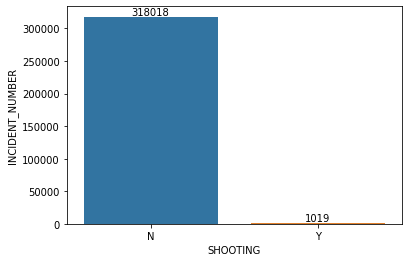

In [28]:
ax = sns.barplot(data=tabel_shooting, x='SHOOTING', y='INCIDENT_NUMBER',ci=False)
for i in ax.containers:
    ax.bar_label(i,)

In [29]:
df

,INCIDENT_NUMBER,GABUNGAN,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,Lat,Long,Location
0,I182070945,I182070945-619,619,Larceny,LARCENY ALL OTHERS,D14,N,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,I182070943-1402,1402,Vandalism,VANDALISM,C11,N,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,I182070941-3410,3410,Towed,TOWED MOTOR VEHICLE,D4,N,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,I182070940-3114,3114,Investigate Property,INVESTIGATE PROPERTY,D4,N,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,I182070938-3114,3114,Investigate Property,INVESTIGATE PROPERTY,B3,N,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,42.275365,-71.090361,"(42.27536542, -71.09036101)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
319068,I050310906-00,I050310906-00-3125,3125,Warrant Arrests,WARRANT ARREST,D4,N,2016-06-05 17:25:00,2016,6,Sunday,17,Part Three,42.336951,-71.085748,"(42.33695098, -71.08574813)"
319069,I030217815-08,I030217815-08-111,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",E18,N,2015-07-09 13:38:00,2015,7,Thursday,13,Part One,42.255926,-71.123172,"(42.25592648, -71.12317207)"
319070,I030217815-08,I030217815-08-3125,3125,Warrant Arrests,WARRANT ARREST,E18,N,2015-07-09 13:38:00,2015,7,Thursday,13,Part Three,42.255926,-71.123172,"(42.25592648, -71.12317207)"
319071,I010370257-00,I010370257-00-3125,3125,Warrant Arrests,WARRANT ARREST,E13,N,2016-05-31 19:35:00,2016,5,Tuesday,19,Part Three,42.302333,-71.111565,"(42.30233307, -71.11156487)"


#### Kolom UCR_Part  

Menurut informasi yang didapat bahwa UCR merepresentasikan tingkatan insiden.  
Terdapat 3 tingkatan UCR yaitu
* UCR Part One = Bagian part one dianggap pelanggaran berat
* UCR Part Two = Bagian part two dianggap pelanggaran medium
* UCR Part Three = Bagian part three dianggap pelanggaran ringan

In [30]:
df['UCR_PART'].value_counts()

Part Three    158536
Part Two      97557 
Part One      61625 
Other         1232  
Name: UCR_PART, dtype: int64

In [31]:
# Pandas
df_group_ucr=df[['UCR_PART','INCIDENT_NUMBER']].groupby('UCR_PART',as_index=False).count().sort_values('INCIDENT_NUMBER', ascending=False)
df_group_ucr

,UCR_PART,INCIDENT_NUMBER
2,Part Three,158536
3,Part Two,97557
1,Part One,61625
0,Other,1232


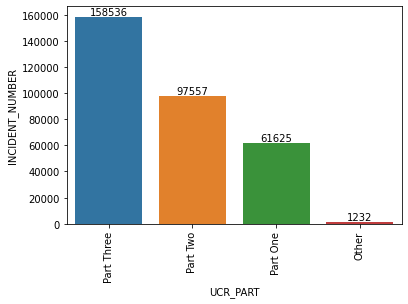

In [62]:
ax = sns.barplot(data=df_group_ucr, x='UCR_PART', y='INCIDENT_NUMBER',ci=False)
plt.xticks(rotation=90)
for i in ax.containers:
    ax.bar_label(i,)

In [32]:
(pd.crosstab(index=df['UCR_PART'],columns='Persentase_Kasus',normalize=True)*100).round(2).sort_values('Persentase_Kasus',ascending=False)

col_0,Persentase_Kasus
UCR_PART,
Part Three,49.71
Part Two,30.59
Part One,19.32
Other,0.39


Part One =  Larceny, Auto Theft, Perampokan, Residential Burglary    

In [56]:
grup1 = df[df['UCR_PART'] == 'Part One']
grupping1 = grup1.groupby('OFFENSE_CODE_GROUP',as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False)
grupping1

,OFFENSE_CODE_GROUP,INCIDENT_NUMBER
4,Larceny,25933
5,Larceny From Motor Vehicle,10847
0,Aggravated Assault,7807
7,Residential Burglary,5605
1,Auto Theft,4850
8,Robbery,4624
2,Commercial Burglary,1337
6,Other Burglary,461
3,Homicide,161


Setelah dihitung dari ke lima data tersebut pada bagian UCR_PART 3 totalnya  19.31594141118428  %


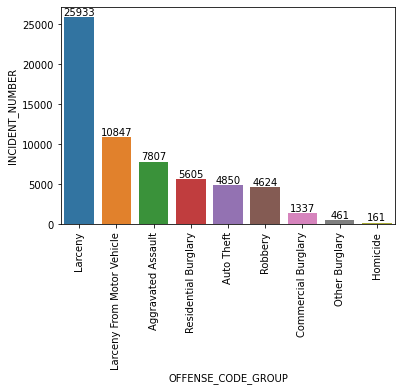

In [57]:
# grupping.plot.bar()
# plt.ylabel('Total Incident')
# plt.show()

ax = sns.barplot(data=grupping1, y='INCIDENT_NUMBER', x='OFFENSE_CODE_GROUP',ci=False)
plt.xticks(rotation=90)
for i in ax.containers:
    ax.bar_label(i,)

print('Setelah dihitung dari ke lima data tersebut pada bagian UCR_PART 3 totalnya ',(grupping1['INCIDENT_NUMBER'].sum() / df['INCIDENT_NUMBER'].count())*100 , ' %')


Part Two = Vandalism, Simple Assault, Restraining Order Violations, Violations, Drug Violation, Fraud

In [34]:
grup2 = df[df['UCR_PART'] == 'Part Two']
# grup3
grupping2 = grup2.groupby('OFFENSE_CODE_GROUP',  as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False)
grupping2 =grupping2.nlargest(n=5, columns='INCIDENT_NUMBER')
grupping2

,OFFENSE_CODE_GROUP,INCIDENT_NUMBER
20,Other,17087
7,Drug Violation,16544
26,Simple Assault,15824
27,Vandalism,15414
28,Violations,6095


Setelah dihitung dari ke lima data tersebut pada bagian UCR_PART 3 totalnya  22.243188094170897  %


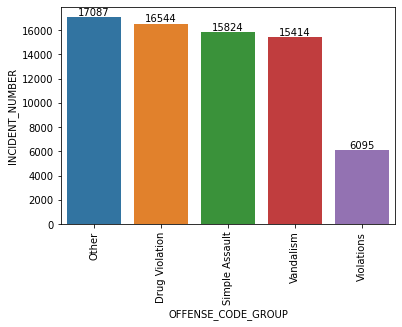

In [53]:
# grupping.plot.bar()
# plt.ylabel('Total Incident')
# plt.show()

ax = sns.barplot(data=grupping2, y='INCIDENT_NUMBER', x='OFFENSE_CODE_GROUP',ci=False)
plt.xticks(rotation=90)
for i in ax.containers:
    ax.bar_label(i,)

print('Setelah dihitung dari ke lima data tersebut pada bagian UCR_PART 3 totalnya ',(grupping2['INCIDENT_NUMBER'].sum() / df['INCIDENT_NUMBER'].count())*100 , ' %')


Part Three = Motor Vehicle Accident Response, Medical Assistance, Investigate Person, Verbal Disputes, Towed, Investigate Property

In [35]:
grup3 = df[df['UCR_PART'] == 'Part Three']
# grup3
grupping3 = grup3.groupby('OFFENSE_CODE_GROUP',  as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False)
grupping3 =grupping3.nlargest(n=5, columns='INCIDENT_NUMBER')
grupping3

,OFFENSE_CODE_GROUP,INCIDENT_NUMBER
14,Motor Vehicle Accident Response,37132
11,Medical Assistance,23540
6,Investigate Person,18748
24,Verbal Disputes,13099
23,Towed,11287


Setelah dihitung dari ke lima data tersebut pada bagian UCR_PART 3 totalnya  32.537291912850236  %


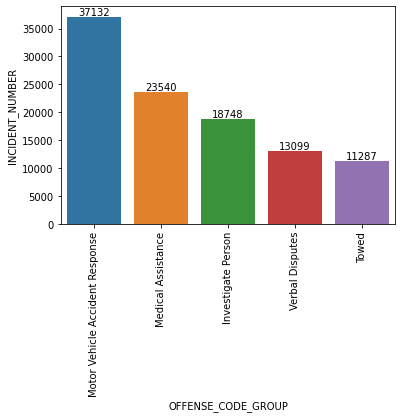

In [54]:
# grupping.plot.bar()
# plt.ylabel('Total Incident')
# plt.show()

ax = sns.barplot(data=grupping3, y='INCIDENT_NUMBER', x='OFFENSE_CODE_GROUP',ci=False)
plt.xticks(rotation=90)
for i in ax.containers:
    ax.bar_label(i,)

print('Setelah dihitung dari ke lima data tersebut pada bagian UCR_PART 3 totalnya ',(grupping3['INCIDENT_NUMBER'].sum() / df['INCIDENT_NUMBER'].count())*100 , ' %')


In [37]:
df.head()

,INCIDENT_NUMBER,GABUNGAN,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,Lat,Long,Location
0,I182070945,I182070945-619,619,Larceny,LARCENY ALL OTHERS,D14,N,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,I182070943-1402,1402,Vandalism,VANDALISM,C11,N,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,I182070941-3410,3410,Towed,TOWED MOTOR VEHICLE,D4,N,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,I182070940-3114,3114,Investigate Property,INVESTIGATE PROPERTY,D4,N,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,I182070938-3114,3114,Investigate Property,INVESTIGATE PROPERTY,B3,N,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,42.275365,-71.090361,"(42.27536542, -71.09036101)"


#### Latitude, Longitude

Pada kolom Latitude, Longitude terdapat nilai kosong NaN. Karena nilai Nan tidak dapat di isi maka akan diisi dengan nilai lat long yang ada pada kolom `Location` dengan nilai 0.000000,0.00000

In [38]:
# melakukan split dengan menggunakan regex 
# r'(\-?\d+\.\d+)\s(\-?\d+\.\d+)' adalah pola regex yang digunakan untuk mengidentifikasi 2 bagian string
# (\-?\d+\.\d+) adalah bagian pertama dari pola, yang mengidentifikasi string yang berisi angka dengan tanda minus (opsional) dan titik decimal
# \s adalah spasi yang memisahkan kedua bagian string
# (\-?\d+\.\d+) adalah bagian kedua dari pola, yang sama dengan bagian pertama

df[['Lat', 'Long']] = df['Location'].str.extract(r'(\-?\d+\.\d+),\s(\-?\d+\.\d+)')

# merubah type menjadi float
df['Lat'] = df['Lat'].astype(float)
df['Long'] = df['Long'].astype(float)
df = df.rename(columns={'Lat': 'Latitude', 'Long': 'Longitude'})
df.head()

,INCIDENT_NUMBER,GABUNGAN,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,Latitude,Longitude,Location
0,I182070945,I182070945-619,619,Larceny,LARCENY ALL OTHERS,D14,N,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,I182070943-1402,1402,Vandalism,VANDALISM,C11,N,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,I182070941-3410,3410,Towed,TOWED MOTOR VEHICLE,D4,N,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,I182070940-3114,3114,Investigate Property,INVESTIGATE PROPERTY,D4,N,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,I182070938-3114,3114,Investigate Property,INVESTIGATE PROPERTY,B3,N,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,42.275365,-71.090361,"(42.27536542, -71.09036101)"


In [39]:
df.isna().sum()

INCIDENT_NUMBER        0   
GABUNGAN               0   
OFFENSE_CODE           0   
OFFENSE_CODE_GROUP     0   
OFFENSE_DESCRIPTION    0   
DISTRICT               1765
SHOOTING               0   
OCCURRED_ON_DATE       0   
YEAR                   0   
MONTH                  0   
DAY_OF_WEEK            0   
HOUR                   0   
UCR_PART               87  
Latitude               0   
Longitude              0   
Location               0   
dtype: int64

#### Kolom `Occurred_On_Date`
* Kolom Occurred_On_Date memiliki tipe data object. Sehingga akan diubah menjadi **datetime**
* Karena pada df atau dataframe tidak terdapat kolom jam dan tanggal, maka akan dicoba untuk menambahkan kedua kolom tersebut. Data jam dan tanggal akan diambil dari `Occurred_On_Date`
* Setelah `Occurred_On_Date` telah terpisah pisah pada kolom jam, hari, tanggal, bulan, tahun, maka pada kolom `Occurred_On_Date` akan di drop.

In [40]:
# Buat kolom Tanggal dan Waktu untuk memisahkan tanggal,bulan,tahun dengan jam/waktu
df['DATE']=df['OCCURRED_ON_DATE'].str[:11]
df['TIME']=df['OCCURRED_ON_DATE'].str[-8:]
df.head()

,INCIDENT_NUMBER,GABUNGAN,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,Latitude,Longitude,Location,DATE,TIME
0,I182070945,I182070945-619,619,Larceny,LARCENY ALL OTHERS,D14,N,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,42.357791,-71.139371,"(42.35779134, -71.13937053)",2018-09-02,13:00:00
1,I182070943,I182070943-1402,1402,Vandalism,VANDALISM,C11,N,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,42.306821,-71.060300,"(42.30682138, -71.06030035)",2018-08-21,00:00:00
2,I182070941,I182070941-3410,3410,Towed,TOWED MOTOR VEHICLE,D4,N,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,42.346589,-71.072429,"(42.34658879, -71.07242943)",2018-09-03,19:27:00
3,I182070940,I182070940-3114,3114,Investigate Property,INVESTIGATE PROPERTY,D4,N,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,42.334182,-71.078664,"(42.33418175, -71.07866441)",2018-09-03,21:16:00
4,I182070938,I182070938-3114,3114,Investigate Property,INVESTIGATE PROPERTY,B3,N,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,42.275365,-71.090361,"(42.27536542, -71.09036101)",2018-09-03,21:05:00


In [41]:
# Ubah kolom Date dengan Time menjadi Datetime
df['DATE']=pd.to_datetime(df['DATE'])
df['TIME']=pd.to_datetime(df['TIME'])
df.dtypes

# df[['DATE','TIME']]=pd.to_datetime(df[['DATE','TIME']])

INCIDENT_NUMBER        object        
GABUNGAN               object        
OFFENSE_CODE           int64         
OFFENSE_CODE_GROUP     object        
OFFENSE_DESCRIPTION    object        
DISTRICT               object        
SHOOTING               object        
OCCURRED_ON_DATE       object        
YEAR                   int64         
MONTH                  int64         
DAY_OF_WEEK            object        
HOUR                   int64         
UCR_PART               object        
Latitude               float64       
Longitude              float64       
Location               object        
DATE                   datetime64[ns]
TIME                   datetime64[ns]
dtype: object

In [42]:
# Memisahkan Kolom DATE untuk membuat kolom baru yaitu TAHUN, NAMA BULAN, NAMA HARI
# Memisahkan kolom TIME untuk membuat kolom baru yaitu jam

# Kolom Date
case_dt=df['DATE'].dt
df['YEAR']=case_dt.year
df['MONTH_NAME']=case_dt.month_name()
df['DAY']=(case_dt.dayofweek)+1
df['WEEKEND']=df['DAY'].apply(lambda x:'Yes' if x>5 else 'No')

df.head(5)

,INCIDENT_NUMBER,GABUNGAN,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,...,HOUR,UCR_PART,Latitude,Longitude,Location,DATE,TIME,MONTH_NAME,DAY,WEEKEND
0,I182070945,I182070945-619,619,Larceny,LARCENY ALL OTHERS,D14,N,2018-09-02 13:00:00,2018,9,...,13,Part One,42.357791,-71.139371,"(42.35779134, -71.13937053)",2018-09-02,2023-02-10 13:00:00,September,7,Yes
1,I182070943,I182070943-1402,1402,Vandalism,VANDALISM,C11,N,2018-08-21 00:00:00,2018,8,...,0,Part Two,42.306821,-71.060300,"(42.30682138, -71.06030035)",2018-08-21,2023-02-10 00:00:00,August,2,No
2,I182070941,I182070941-3410,3410,Towed,TOWED MOTOR VEHICLE,D4,N,2018-09-03 19:27:00,2018,9,...,19,Part Three,42.346589,-71.072429,"(42.34658879, -71.07242943)",2018-09-03,2023-02-10 19:27:00,September,1,No
3,I182070940,I182070940-3114,3114,Investigate Property,INVESTIGATE PROPERTY,D4,N,2018-09-03 21:16:00,2018,9,...,21,Part Three,42.334182,-71.078664,"(42.33418175, -71.07866441)",2018-09-03,2023-02-10 21:16:00,September,1,No
4,I182070938,I182070938-3114,3114,Investigate Property,INVESTIGATE PROPERTY,B3,N,2018-09-03 21:05:00,2018,9,...,21,Part Three,42.275365,-71.090361,"(42.27536542, -71.09036101)",2018-09-03,2023-02-10 21:05:00,September,1,No


In [43]:
# Drop semua kolom yang informasinya sudah ada di kolom Date dan Time
df.drop(['OCCURRED_ON_DATE', 'DATE','TIME'],axis=1,inplace=True)
df.head(5)

,INCIDENT_NUMBER,GABUNGAN,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,SHOOTING,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,Latitude,Longitude,Location,MONTH_NAME,DAY,WEEKEND
0,I182070945,I182070945-619,619,Larceny,LARCENY ALL OTHERS,D14,N,2018,9,Sunday,13,Part One,42.357791,-71.139371,"(42.35779134, -71.13937053)",September,7,Yes
1,I182070943,I182070943-1402,1402,Vandalism,VANDALISM,C11,N,2018,8,Tuesday,0,Part Two,42.306821,-71.060300,"(42.30682138, -71.06030035)",August,2,No
2,I182070941,I182070941-3410,3410,Towed,TOWED MOTOR VEHICLE,D4,N,2018,9,Monday,19,Part Three,42.346589,-71.072429,"(42.34658879, -71.07242943)",September,1,No
3,I182070940,I182070940-3114,3114,Investigate Property,INVESTIGATE PROPERTY,D4,N,2018,9,Monday,21,Part Three,42.334182,-71.078664,"(42.33418175, -71.07866441)",September,1,No
4,I182070938,I182070938-3114,3114,Investigate Property,INVESTIGATE PROPERTY,B3,N,2018,9,Monday,21,Part Three,42.275365,-71.090361,"(42.27536542, -71.09036101)",September,1,No


In [44]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 319037 entries, 0 to 319072
Data columns (total 18 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   INCIDENT_NUMBER      319037 non-null  object 
 1   GABUNGAN             319037 non-null  object 
 2   OFFENSE_CODE         319037 non-null  int64  
 3   OFFENSE_CODE_GROUP   319037 non-null  object 
 4   OFFENSE_DESCRIPTION  319037 non-null  object 
 5   DISTRICT             317272 non-null  object 
 6   SHOOTING             319037 non-null  object 
 7   YEAR                 319037 non-null  int64  
 8   MONTH                319037 non-null  int64  
 9   DAY_OF_WEEK          319037 non-null  object 
 10  HOUR                 319037 non-null  int64  
 11  UCR_PART             318950 non-null  object 
 12  Latitude             319037 non-null  float64
 13  Longitude            319037 non-null  float64
 14  Location             319037 non-null  object 
 15  MONTH_NAME       

## Export Data Clean

Setelah melakukan pembersihan data, maka akan dilakukan export data yang akan di pakai untuk visualisasi menggunakan BI tools yaitu tableau

In [ ]:
df.to_excel('data_final_crime_in_boston_Location.xlsx') # untuk digunakan dalam membuat Tableau Dashboard

# DATA ANALYSIS

## 1. Bagaimana **angka Insiden** di kota Boston?
* Berdasarkan tahun, bulan, hari

Pertanyaan ini untuk mengetahui angka insiden setiap waktunya, sehingga penanganan atau antisipasi lonjakan insiden yang marak terjadi di Boston dapat teratasi semua. Maka Boston Police Department membutuhkan data tentang jwaktu yang sering terjadi insiden.

In [ ]:
df.head()

,INCIDENT_NUMBER,GABUNGAN,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,SHOOTING,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,Latitude,Longitude,Location,MONTH_NAME,DAY,WEEKEND
0,I182070945,I182070945-619,619,Larceny,LARCENY ALL OTHERS,D14,N,2018,9,Sunday,13,Part One,42.357791,-71.139371,"(42.35779134, -71.13937053)",September,7,Yes
1,I182070943,I182070943-1402,1402,Vandalism,VANDALISM,C11,N,2018,8,Tuesday,0,Part Two,42.306821,-71.060300,"(42.30682138, -71.06030035)",August,2,No
2,I182070941,I182070941-3410,3410,Towed,TOWED MOTOR VEHICLE,D4,N,2018,9,Monday,19,Part Three,42.346589,-71.072429,"(42.34658879, -71.07242943)",September,1,No
3,I182070940,I182070940-3114,3114,Investigate Property,INVESTIGATE PROPERTY,D4,N,2018,9,Monday,21,Part Three,42.334182,-71.078664,"(42.33418175, -71.07866441)",September,1,No
4,I182070938,I182070938-3114,3114,Investigate Property,INVESTIGATE PROPERTY,B3,N,2018,9,Monday,21,Part Three,42.275365,-71.090361,"(42.27536542, -71.09036101)",September,1,No


### TAHUN

In [ ]:
df_Tahun_Name = df.groupby('YEAR', as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='YEAR', ascending=False)
df_Tahun_Name

,YEAR,INCIDENT_NUMBER
3,2018,65685
2,2017,100883
1,2016,99106
0,2015,53363


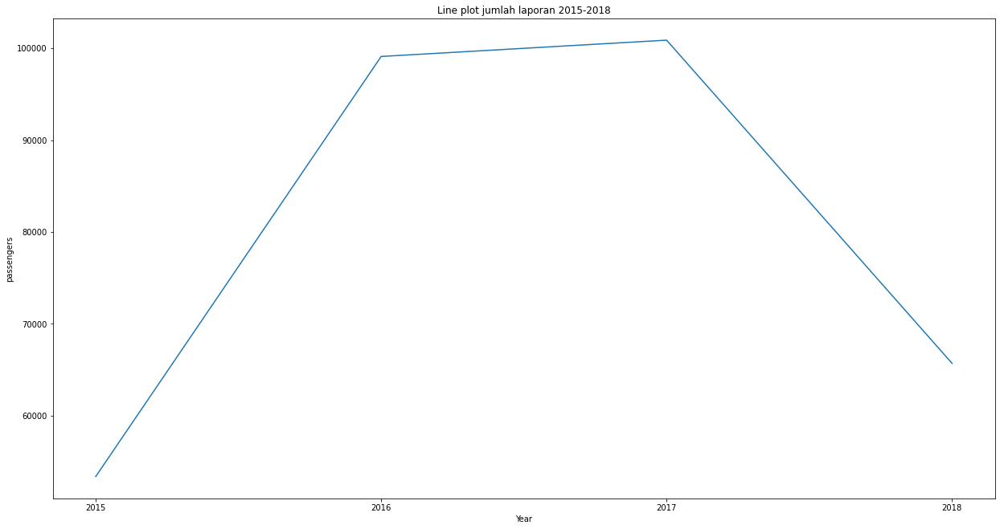

In [ ]:
gb_year = df.groupby('YEAR', as_index=False).count()
# gb_year
plt.plot(gb_year['YEAR'],gb_year['INCIDENT_NUMBER'])
plt.title('Line plot jumlah laporan 2015-2018')
plt.xlabel('Year')
plt.ylabel('passengers')
plt.ticklabel_format(useOffset=False,)
xticks = np.arange(2015, 2019, 1)
plt.xticks(xticks)


plt.show()


Dari hasil analisa setiap tahunnya terdapat peningkatan yang cukup besar pada 2016, serta penurunan yang derastis pada tahun 2018

Anomali tahun 2016 dan 2018 akan coba untuk diperhatikan lebih dalam  
* UCR part berapakah yang dominan meningkatnya kasus pada 2016? 
* Apa penyebab turunnya kasus pada 2018?  
* Apakah data tahun 2015 dan 2018 tidak lengkap?  

In [ ]:
# UCR part berapakah yang dominan meningkatnya kasus pada 2016?
df_2016= df[df['YEAR']==2016]
df_ucr_2016 = df_2016.groupby('UCR_PART', as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False)
df_ucr_2016

# didapatkan informasi bahwa kebanyakan kejahatan yang dilakukan pada 2016 adalah UCR part three

,UCR_PART,INCIDENT_NUMBER
2,Part Three,48738
3,Part Two,30748
1,Part One,19220
0,Other,368


In [ ]:
# Pada 2016 insiden yang terjadi setiap bulannya relatif sama
df_bulan_2016 = df_2016.groupby('MONTH_NAME', as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False)
df_bulan_2016

,MONTH_NAME,INCIDENT_NUMBER
1,August,8938
5,July,8618
10,October,8582
8,May,8578
6,June,8558
11,September,8521
7,March,8199
0,April,8101
2,December,7951
9,November,7922


In [60]:
# Apakah data tahun 2015 dan 2018 tidak lengkap?
print('Jumlah bulan yang ada dalam data pada tahun 2015 ',df[df['YEAR']==2015]['MONTH'].max() - df[df['YEAR']==2015]['MONTH'].min() + 1, ' Bulan')
print('Jumlah bulan yang ada dalam data pada tahun 2016 ',df[df['YEAR']==2016]['MONTH'].max() - df[df['YEAR']==2016]['MONTH'].min() + 1, ' Bulan')
print('Jumlah bulan yang ada dalam data pada tahun 2017 ',df[df['YEAR']==2017]['MONTH'].max() - df[df['YEAR']==2017]['MONTH'].min() + 1, ' Bulan')
print('Jumlah bulan yang ada dalam data pada tahun 2018 ',df[df['YEAR']==2018]['MONTH'].max() - df[df['YEAR']==2018]['MONTH'].min() + 1, ' Bulan')

# Kesimpulannya adalah bahwa pada data tahun 2015 dan 2018 data belum terekam sepenuhnya selama 1 tahun, tetapi hanya sampai 7 atau 9 bulan data

Jumlah bulan yang ada dalam data pada tahun 2015  7  Bulan
Jumlah bulan yang ada dalam data pada tahun 2016  12  Bulan
Jumlah bulan yang ada dalam data pada tahun 2017  12  Bulan
Jumlah bulan yang ada dalam data pada tahun 2018  9  Bulan


### BULAN

In [64]:
df_bulan =  df.groupby('MONTH_NAME', as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False)
df_bulan

,MONTH_NAME,INCIDENT_NUMBER
1,August,34820
5,July,34551
6,June,30565
11,September,26539
8,May,26199
10,October,25729
7,March,24146
0,April,24086
9,November,23675
4,January,23606


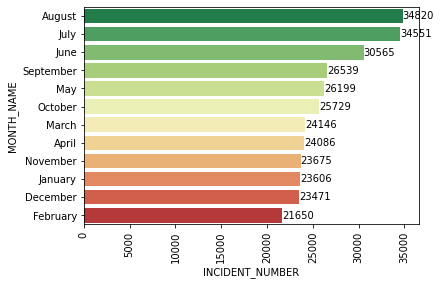

In [67]:
# Grafik ini menggambarkan bahwa pada bulan juni sampai agustus terjadi insiden dengan jumlah yang paling tinggi

ax = sns.barplot(data=df_bulan, y='MONTH_NAME', x='INCIDENT_NUMBER',palette='RdYlGn_r',ci=False)
plt.xticks(rotation=90)
for i in ax.containers:
    ax.bar_label(i,)

In [ ]:
# 10 kota dengan jumlah kandidat paling banyak, dibagi berdasarkan target 
df_ct=pd.crosstab(df['YEAR'],df['MONTH_NAME'])
df_ct['Total']=df_ct.sum(axis=1)
df_ct.sort_values('Total',ascending=False).head(10)

MONTH_NAME,April,August,December,February,January,July,June,March,May,November,October,September,Total
YEAR,,,,,,,,,,,,,
2017,8069,9206,7535,7408,7991,9075,8985,8179,8715,7935,8845,8940,100883
2016,8101,8938,7951,7305,7833,8618,8558,8199,8578,7922,8582,8521,99106
2018,7916,8337,0,6937,7782,8538,8834,7768,8906,0,0,667,65685
2015,0,8339,7985,0,0,8320,4188,0,0,7818,8302,8411,53363


### HARI

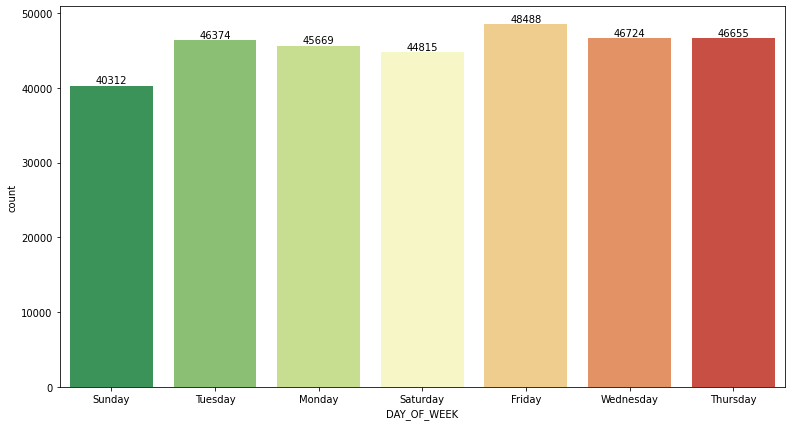

In [ ]:
plt.figure(figsize = (13, 7))
ax = sns.countplot(x = df['DAY_OF_WEEK'], palette='RdYlGn_r')

for i in ax.containers:
    ax.bar_label(i,)
# for i in range(df['DAY_OF_WEEK'].nunique()):
#     count = df[df['DAY_OF_WEEK'] == df['DAY_OF_WEEK'].value_counts().index[i]].shape[0]
#     plt.text(i, count, str(count), ha = 'center', va = 'bottom')

#### Analisa melalui Uji Hipotesis dengan uji proporsi (Z-Test Single Population Proportion)

Untuk melihat apakah suatu insiden banyak terjadi pada hari kerja atau hari libur maka akan dilakukan uji statistik menggunakan Z-test

Dengan Hipotesis
- H0 : proporsi suatu insiden yang terjadi pada akhir pekan = 0.5
- Ha : proporsi suatu insiden yang terjadi pada akhir pekan < 0.5

In [47]:
weekend=pd.crosstab(index=df['WEEKEND'],columns='Jumlah_Kasus')
weekend_rate=weekend.loc['Yes','Jumlah_Kasus']/len(df)
weekend

from statsmodels.stats.proportion import proportions_ztest
s,pval=proportions_ztest(weekend_rate,len(weekend),0.5,alternative='smaller')
if pval/2 <= 0.05:
    print(f'p-value={pval/2} \nTolak H0, proporsi tindak kriminal yang terjadi pada akhir pekan lebih kecil dari 50%')
else:
    print(f'p-value={pval/2} \nTidak Tolak H0, proporsi tindak kriminal yang terjadi pada akhir pekan sama dengan 50%')

p-value=0.03183261613809501 
Tolak H0, proporsi tindak kriminal yang terjadi pada akhir pekan lebih kecil dari 50%


### JAM

c:\Users\User\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


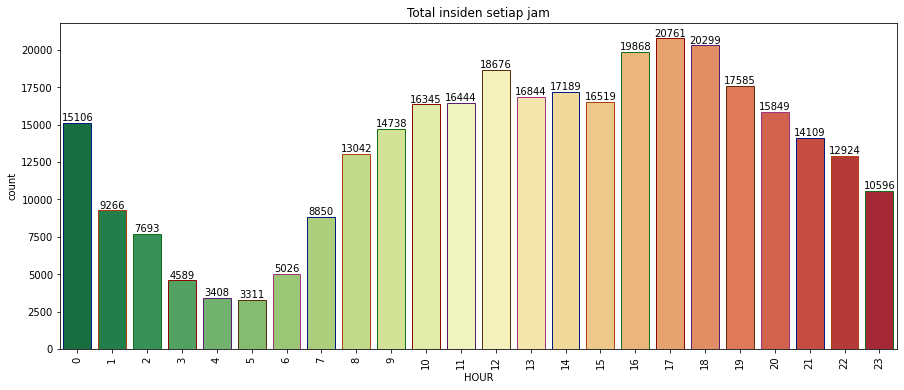

In [ ]:
plt.subplots(figsize=(15,6))
ax =sns.countplot('HOUR',data=df,palette='RdYlGn_r',edgecolor=sns.color_palette('dark',7))

for i in ax.containers:
    ax.bar_label(i,)

plt.xticks(rotation=90)
plt.title('Total insiden setiap jam')
plt.show()

### Insight

* Dari hasil analisis yang dilakukan puncak terjadinya suatu tindak kejahatan adalah pukul 17:00 dan mengalami penurunan pada pukul 05:00.
* Kejahatan paling sering terjadi pada hari Jumat dan paling kecil kemungkinannya terjadi pada hari Minggu.
* Kejahatan cenderung terjadi terutama antara Agustus, Juni dan Juli.

### Recommendation

* Dengan mengetahui puncak terbanyak terjadinya insiden, maka pada jam 15-20 menyediakan anggota kepolisian lebih untuk siap siaga.

* Membagi Shift jaga yang disesuaikan dengan jumlah personil yang ada:
    1. Shift 1 : 00.00 - 07.00 = Tingkat insiden pada shift 1 memang cenderung kecil, sehingga polisi yang berjaga dapat dikurangi
    2. Shift 2 : 07.00 - 15.00 = Tingkat insiden pada shift 2 memang cenderung meningkat, sehingga polisi yang berjaga dapat ditambah
    3. Shift 3 : 15.00 - 00.00 = Tingkat insiden pada shift 3memiliki tingkat insiden yang tinggi, pada shift ini dapat ditambah personil lebih banyak

* Meningkatkan keamanan pada bulan juni, juli dan agustus. dikarenakan bulan-bulan tersebut tingkat insidennya memiliki nilai tertinggi

## 2. Bagaimana trend **jenis kejahatan** di kota Boston?

* Mencari trend **jenis kejahatan** dari keseluruhan data
* Dari hasil analisis sebelumnya didapatkan informasi bahwa puncak terjadinya insiden adalah pukul 17:00. Maka akan dicari kategori insiden apa yang sering terjadi di rentang pukul 16,17,18

In [ ]:
(df.groupby('OFFENSE_CODE_GROUP', as_index=False)["INCIDENT_NUMBER"].count().sort_values( by='INCIDENT_NUMBER',ascending=False).head())

,OFFENSE_CODE_GROUP,INCIDENT_NUMBER
43,Motor Vehicle Accident Response,37132
34,Larceny,25933
40,Medical Assistance,23540
31,Investigate Person,18748
46,Other,18073


c:\Users\User\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


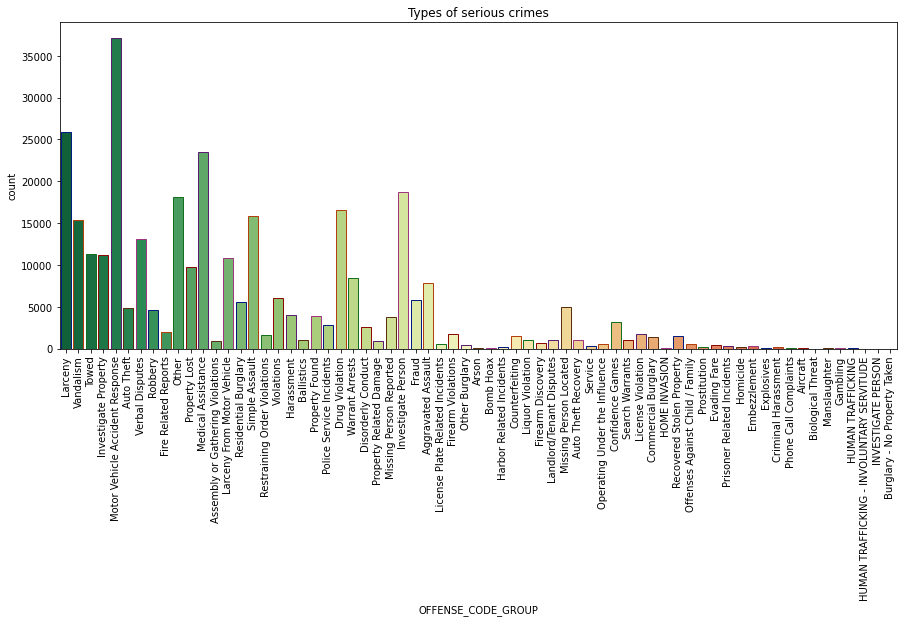

In [69]:
plt.subplots(figsize=(15,6))
ax = sns.countplot('OFFENSE_CODE_GROUP',data=df,palette='RdYlGn_r',edgecolor=sns.color_palette('dark',7))

plt.xticks(rotation=90)
plt.title('Types of serious crimes')
plt.show()

In [ ]:
# 5 kejadian terbanyak di Boston
total_insiden=pd.crosstab(index=[df['OFFENSE_CODE'],df['OFFENSE_CODE_GROUP'],df['OFFENSE_DESCRIPTION']],columns='Total_Insiden').sort_values('Total_Insiden',ascending=False)
# total_insiden
persen_kasus=(pd.crosstab(index=[df['OFFENSE_CODE'],df['OFFENSE_CODE_GROUP'],df['OFFENSE_DESCRIPTION']],columns='Persentase_Insiden(%)',normalize=True)*100).round(2).sort_values('Persentase_Insiden(%)',ascending=False)
# jumlah_kasus_pct
df_tot_perc=pd.merge(total_insiden,persen_kasus,on=['OFFENSE_CODE','OFFENSE_CODE_GROUP','OFFENSE_DESCRIPTION']).head(5)
df_tot_perc

,,col_0,Total_Insiden,Persentase_Insiden(%)
OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,,
3006,Medical Assistance,SICK/INJURED/MEDICAL - PERSON,18783,5.89
3115,Investigate Person,INVESTIGATE PERSON,18748,5.88
3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,16323,5.12
1402,Vandalism,VANDALISM,15153,4.75
802,Simple Assault,ASSAULT SIMPLE - BATTERY,14790,4.64


In [ ]:
## Melihat persentasi setiap UCR_PART dan total kasusnya
ucr_case=pd.crosstab(index=df['UCR_PART'],columns='Jumlah_Kasus').sort_values('Jumlah_Kasus',ascending=False)
ucr_case['%']=(pd.crosstab(index=df['UCR_PART'],columns='Jumlah_Kasus',normalize=True)*100).round(2)
ucr_case

col_0,Jumlah_Kasus,%
UCR_PART,,
Part Three,158536,49.71
Part Two,97557,30.59
Part One,61625,19.32
Other,1232,0.39


In [ ]:
## Melihat persentasi setiap UCR_PART dan total kasusnya
df_16_18 = df[(df['HOUR']==16) | (df['HOUR']==17) | (df['HOUR']==18)]
ucr_case=pd.crosstab(index=df_16_18['UCR_PART'],columns='Jumlah_Kasus').sort_values('Jumlah_Kasus',ascending=False)
ucr_case['%']=(pd.crosstab(index=df_16_18['UCR_PART'],columns='Jumlah_Kasus',normalize=True)*100).round(2)
ucr_case

col_0,Jumlah_Kasus,%
UCR_PART,,
Part Three,28211,46.31
Part Two,20713,34.00
Part One,11806,19.38
Other,183,0.30


In [ ]:
display(df.groupby(['OFFENSE_CODE_GROUP'], as_index=False)["INCIDENT_NUMBER"].count().sort_values(by='INCIDENT_NUMBER', ascending=False).head())

,OFFENSE_CODE_GROUP,INCIDENT_NUMBER
43,Motor Vehicle Accident Response,37132
34,Larceny,25933
40,Medical Assistance,23540
31,Investigate Person,18748
46,Other,18073


In [ ]:
df_16=df[(df['HOUR']==16)]
df_17=df[(df['HOUR']==17)]
df_18=df[(df['HOUR']==18)]

display(df_16.groupby(['HOUR', 'OFFENSE_CODE_GROUP'])["INCIDENT_NUMBER"].count().sort_values( ascending=False).head())
display(df_17.groupby(['HOUR', 'OFFENSE_CODE_GROUP'])["INCIDENT_NUMBER"].count().sort_values( ascending=False).head())
display(df_18.groupby(['HOUR', 'OFFENSE_CODE_GROUP'])["INCIDENT_NUMBER"].count().sort_values( ascending=False).head())

HOUR  OFFENSE_CODE_GROUP             
16    Motor Vehicle Accident Response    2454
      Larceny                            1954
      Drug Violation                     1659
      Medical Assistance                 1286
      Investigate Person                 1255
Name: INCIDENT_NUMBER, dtype: int64

HOUR  OFFENSE_CODE_GROUP             
17    Motor Vehicle Accident Response    2596
      Drug Violation                     2143
      Larceny                            1937
      Medical Assistance                 1306
      Investigate Person                 1178
Name: INCIDENT_NUMBER, dtype: int64

HOUR  OFFENSE_CODE_GROUP             
18    Motor Vehicle Accident Response    2306
      Drug Violation                     2049
      Larceny                            1833
      Medical Assistance                 1284
      Investigate Person                 1185
Name: INCIDENT_NUMBER, dtype: int64

In [ ]:
df.head()

,INCIDENT_NUMBER,GABUNGAN,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,SHOOTING,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,Latitude,Longitude,Location,MONTH_NAME,DAY,WEEKEND
0,I182070945,I182070945-619,619,Larceny,LARCENY ALL OTHERS,D14,N,2018,9,Sunday,13,Part One,42.357791,-71.139371,"(42.35779134, -71.13937053)",September,7,Yes
1,I182070943,I182070943-1402,1402,Vandalism,VANDALISM,C11,N,2018,8,Tuesday,0,Part Two,42.306821,-71.060300,"(42.30682138, -71.06030035)",August,2,No
2,I182070941,I182070941-3410,3410,Towed,TOWED MOTOR VEHICLE,D4,N,2018,9,Monday,19,Part Three,42.346589,-71.072429,"(42.34658879, -71.07242943)",September,1,No
3,I182070940,I182070940-3114,3114,Investigate Property,INVESTIGATE PROPERTY,D4,N,2018,9,Monday,21,Part Three,42.334182,-71.078664,"(42.33418175, -71.07866441)",September,1,No
4,I182070938,I182070938-3114,3114,Investigate Property,INVESTIGATE PROPERTY,B3,N,2018,9,Monday,21,Part Three,42.275365,-71.090361,"(42.27536542, -71.09036101)",September,1,No


### Insight

* Dari data semua dataframe kebanyakan insiden yang terjadi adalah kategori kecelakaan bermotor, Pencurian, Narkoba, Bantuan Medis.
* Jika dilihat lebih detail pada OFFENSE_DESCRIPTION maka tindakan polisi paling banyak adalah Medical Assistance
* Pada rentan jam 16-18 memiliki kesamaan kategori terjadinya suatu insiden yaitu kecelakaan bermotor, Pencurian, Narkoba, Bantuan Medis

### Recommendation

* Dengan jenis insiden yang sering terjadi pada pukul 16-18 Motor Vehicle Accident Response, Drug Violation, Larceny, Medical Assistance,Investigate Person maka personil yang disiagakan harus memiliki bekal ilmu mengenai penanganan insiden-insiden tersebut.
* Memberikan penyuluhan terhadap masyarakat tentang pentingnya berhati-hati berkendara. sehingga diharapkan angka insiden kecelakaan dapat dikurangi.
* Pada OFFENSE_DESCRIPTION didapatkan terbanyak adalah respon mengenai edical Assistance, sehingga direkomendasikan bahwa anggota kepolisian wajib memiliki keahlian penanganan pertama

## 3. Dimana distrik yang paling banyak tindakan tindak kriminal? 

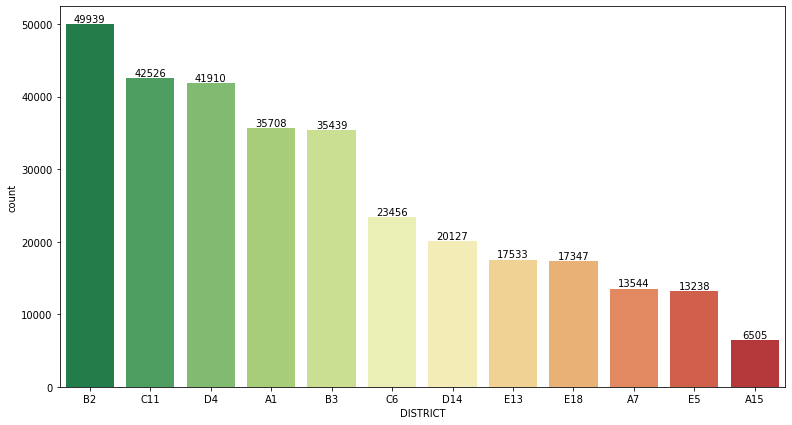

In [ ]:
plt.figure(figsize = (13, 7))
ax= sns.countplot(x = df.DISTRICT, palette='RdYlGn_r',order = df['DISTRICT'].value_counts().index)
for i in ax.containers:
    ax.bar_label(i,)

### Insight

* Pada analisa yang dilakukan terdapat 3 DISTRICT yang paling tinggi dalam jumlah insiden yang ditangani oleh kepolisian boston. 3 DISTRICT tersebut adalah B2 (Roxbury), C11 (Dorchester) dan D4 (South End)

### Recommendation
* Boston Police Department harus memberikan pemantauan khusu di 3 DISTRICT yang memiliki tingkat insiden yang cukup banyak.
* Boston Police Department disarankan untuk membuat satuan khusus untuk melakukan patroli dan mempersiapkan personil untuk memberikan bantuan secara ceoat dan tepat.

## Dimanakah titik spesifik yang paling sering terjadi suatu insiden?

Pada bagian ini akan menganalisa data keseluruhan yang akan dilihat lebih detail dengan heatmap folium

In [70]:
B2_district=df[['Latitude','Longitude']].dropna()
B2_district['Latitude'].fillna(0, inplace = True)
B2_district['Longitude'].fillna(0, inplace = True) 

map_1=folium.Map(location=[42.356145,-71.064083], 
                 tiles = "OpenStreetMap",
                zoom_start=11)

HeatMap(data=B2_district, radius=16).add_to(map_1)

map_1

In [ ]:
B2_district=df.loc[df['DISTRICT']=='D4'][['Latitude','Longitude']].dropna()
B2_district['Latitude'].fillna(0, inplace = True)
B2_district['Longitude'].fillna(0, inplace = True) 

map_1=folium.Map(location=[42.356145,-71.064083], 
                 tiles = "OpenStreetMap",
                zoom_start=11)

HeatMap(data=B2_district, radius=16).add_to(map_1)

map_1

In [ ]:
B2_district=df.loc[df['DISTRICT']=='A1'][['Latitude','Longitude']].dropna()
B2_district['Latitude'].fillna(0, inplace = True)
B2_district['Longitude'].fillna(0, inplace = True) 

map_1=folium.Map(location=[42.356145,-71.064083], 
                 tiles = "OpenStreetMap",
                zoom_start=11)

HeatMap(data=B2_district, radius=16).add_to(map_1)

map_1

### Insight
- Tindakan polisi paling banyak dilakukan pada tanda warna merah gelap.

### Recommendation
- Boston Police Department harus mengerahkan atau memberikan perhatian khusus terhadap bagian peta dengan warna merah gelap.

## Insiden apa yang menyebabkan adanya penembakan?

Pada bagian ini dicari insiden apa penyebab ternyadinya tembakan. Dari informasi tersebut akan dilakukan evaluasi apakah tindakan yang dilakukan sudah sesuai atau tidak

In [ ]:
df_SHOOTING=df[df['SHOOTING']=='Y']
df_SHOOTING.head()

,INCIDENT_NUMBER,GABUNGAN,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,SHOOTING,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,Latitude,Longitude,Location,MONTH_NAME,DAY,WEEKEND
1295,I182069509,I182069509-413,413,Aggravated Assault,ASSAULT - AGGRAVATED - BATTERY,E18,Y,2018,8,Wednesday,23,Part One,42.250405,-71.131737,"(42.25040550, -71.13173740)",August,3,No
1860,I182068876,I182068876-413,413,Aggravated Assault,ASSAULT - AGGRAVATED - BATTERY,B2,Y,2018,8,Monday,22,Part One,42.321042,-71.072153,"(42.32104169, -71.07215291)",August,1,No
3259,I182067317,I182067317-111,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",B2,Y,2018,8,Wednesday,15,Part One,42.315689,-71.089514,"(42.31568920, -71.08951391)",August,3,No
3260,I182067317,I182067317-2662,2662,Ballistics,BALLISTICS EVIDENCE/FOUND,B2,Y,2018,8,Wednesday,15,Part Two,42.315689,-71.089514,"(42.31568920, -71.08951391)",August,3,No
4107,I182066420,I182066420-413,413,Aggravated Assault,ASSAULT - AGGRAVATED - BATTERY,A15,Y,2018,8,Sunday,22,Part One,42.378085,-71.057841,"(42.37808452, -71.05784115)",August,7,Yes


In [ ]:
df_SHOOTING_group = df_SHOOTING.groupby(['OFFENSE_DESCRIPTION'], as_index=False)['INCIDENT_NUMBER'].count()
df_SHOOTING_UCR = df_SHOOTING.groupby(['UCR_PART'], as_index=False)['INCIDENT_NUMBER'].count()

In [ ]:
## Melihat persentasi setiap UCR_PART dan total kasusnya
# df_16_18 = df[(df['HOUR']==16) | (df['HOUR']==17) | (df['HOUR']==18)]
ct_SHOOTING_group=pd.crosstab(index=df_SHOOTING['OFFENSE_DESCRIPTION'],columns='Jumlah_Kasus').sort_values('Jumlah_Kasus',ascending=False)
ct_SHOOTING_group['%']=(pd.crosstab(index=df_SHOOTING['OFFENSE_DESCRIPTION'],columns='Jumlah_Kasus',normalize=True)*100).round(2)
ct_SHOOTING_group.head()

col_0,Jumlah_Kasus,%
OFFENSE_DESCRIPTION,,
ASSAULT - AGGRAVATED - BATTERY,494,48.48
"MURDER, NON-NEGLIGIENT MANSLAUGHTER",121,11.87
WARRANT ARREST,73,7.16
"WEAPON - FIREARM - CARRYING / POSSESSING, ETC",48,4.71
BALLISTICS EVIDENCE/FOUND,42,4.12


In [ ]:
df_SHOOTING_UCR

,UCR_PART,INCIDENT_NUMBER
0,Other,1
1,Part One,663
2,Part Three,166
3,Part Two,184


### Insight
- Tindakan tembakan paling banyak terjadi pada kasus UCR PART One. 
- kejadian SHOOTING kebanyakan pada kejadian ASSAULT - AGGRAVATED - BATTERY, MURDER, NON-NEGLIGIENT MANSLAUGHTER, WARRANT ARREST .
- Ketika dilihat dari OFFENSE_DESCRIPTION memang kejahatan tersebut digolongkan kejahatan yang beresiko tinggi.

### Recommendation
- Dari analisa yang dilakukan menunjukan bahwa tindakan penembakan dilakukan karena adanya resiko terhadap petugas, dan hal tersebut sudah sesuai dengan SOP yang ada
- Boston Police Department memberikan pelatihan penanganan untuk kejahatan yang beresiko tinggi. Agar tidak adanya korban anggora kepolisian